# In this notebook we'll plot the sequential organization of each bird's song
First, we need to get data in the right format, then project the data, then we'll plot.

### Load the dataframe

In [1]:
import pandas as pd
from avgn.utils.paths import DATA_DIR

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [2]:
syllable_df = pd.read_pickle(DATA_DIR / 'example_bengalese_finch_dataset.pickle')
syllable_df[:3]

,start_time,end_time,labels,sequence_num,indv,indvi,key,rate,spectrogram
0,1.158,1.239,0,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 0, 8, 10, 45, 84, 67, 3..."
1,1.323,1.411,0,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 10, 10, 10, 9, 11, 25, ..."
2,1.430,1.533,1,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 8,..."


### First, we need to get the relative position of each syllable within each sequence

In [8]:
import numpy as np
from tqdm.autonotebook import tqdm

In [15]:
indv_dfs = []
for indv in tqdm(syllable_df.indv.unique()):
    indv_df = syllable_df[syllable_df.indv == indv]
    
    syllables_sequence_pos = np.concatenate(
        [
            np.arange(np.sum(indv_df.key == key))
            for key in indv_df.key.unique()
        ]
    )
    syllables_sequence_id = np.concatenate(
        [
            np.repeat(ki, np.sum(indv_df.key == key))
            for ki, key in enumerate(indv_df.key.unique())
        ]
    )
    indv_df.loc[:,"syllables_sequence_pos"] = syllables_sequence_pos
    indv_df.loc[:,"syllables_sequence_id"] = syllables_sequence_id
    indv_dfs.append(indv_df)
syllable_df = pd.concat(indv_dfs)
syllable_df[:3]

,start_time,end_time,labels,sequence_num,indv,indvi,key,rate,spectrogram,syllables_sequence_pos,syllables_sequence_id
0,1.158,1.239,0,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 0, 8, 10, 45, 84, 67, 3...",0,0
1,1.323,1.411,0,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 10, 10, 10, 9, 11, 25, ...",1,0
2,1.430,1.533,1,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 8,...",2,0


### Now let's generate a UMAP projection for each syllable

In [16]:
from avgn.signalprocessing.create_spectrogram_dataset import flatten_spectrograms
import umap

In [17]:
indv_dfs = []
for indv in tqdm(syllable_df.indv.unique()):
    indv_df = syllable_df[syllable_df.indv == indv]
    
    specs = np.array(
        [
            i / np.max(i)
            for i in indv_df.spectrogram.values
        ]
    )
    # flatten the spectrograms into 1D
    specs_flattened = flatten_spectrograms(specs)
    
    # project (you can choose different UMAP parameters here)
    fit = umap.UMAP(min_dist=0.25, verbose=True)
    z = list(fit.fit_transform(specs_flattened))
    indv_df.loc[:,"umap"] = z
    
    indv_dfs.append(indv_df)
syllable_df = pd.concat(indv_dfs)
syllable_df[:3]

UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.25, verbose=True)
Construct fuzzy simplicial set
Thu Nov 19 11:32:21 2020 Finding Nearest Neighbors
Thu Nov 19 11:32:21 2020 Building RP forest with 9 trees
Thu Nov 19 11:32:22 2020 parallel NN descent for 12 iterations
	 0  /  12
	 1  /  12
	 2  /  12
	 3  /  12
Thu Nov 19 11:32:31 2020 Finished Nearest Neighbor Search
Thu Nov 19 11:32:33 2020 Construct embedding
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Thu Nov 19 11:32:42 2020 Finished embedding


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.25, verbose=True)
Construct fuzzy simplicial set
Thu Nov 19 11:32:43 2020 Finding Nearest Neighbors
Thu Nov 19 11:32:43 2020 Building RP forest with 14 trees
Thu Nov 19 11:32:45 2020 parallel NN descent for 15 iterations
	 0  /  15
	 1  /  15
	 2  /  15
	 3  /  15
Thu Nov 19 11:32:47 2020 Finished Nearest Neighbor Search
Thu Nov 19 11:32:47 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Nov 19 11:33:20 2020 Finished embedding


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.25, verbose=True)
Construct fuzzy simplicial set
Thu Nov 19 11:33:22 2020 Finding Nearest Neighbors
Thu Nov 19 11:33:22 2020 Building RP forest with 14 trees
Thu Nov 19 11:33:23 2020 parallel NN descent for 15 iterations
	 0  /  15
	 1  /  15
	 2  /  15
	 3  /  15
Thu Nov 19 11:33:24 2020 Finished Nearest Neighbor Search
Thu Nov 19 11:33:25 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Nov 19 11:33:46 2020 Finished embedding


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.25, verbose=True)
Construct fuzzy simplicial set
Thu Nov 19 11:33:47 2020 Finding Nearest Neighbors
Thu Nov 19 11:33:47 2020 Building RP forest with 12 trees
Thu Nov 19 11:33:48 2020 parallel NN descent for 14 iterations
	 0  /  14
	 1  /  14
	 2  /  14
	 3  /  14
Thu Nov 19 11:33:49 2020 Finished Nearest Neighbor Search
Thu Nov 19 11:33:49 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Nov 19 11:34:06 2020 Finished embedding


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.25, verbose=True)
Construct fuzzy simplicial set
Thu Nov 19 11:34:08 2020 Finding Nearest Neighbors
Thu Nov 19 11:34:08 2020 Building RP forest with 13 trees
Thu Nov 19 11:34:09 2020 parallel NN descent for 15 iterations
	 0  /  15
	 1  /  15
	 2  /  15
	 3  /  15
Thu Nov 19 11:34:10 2020 Finished Nearest Neighbor Search
Thu Nov 19 11:34:10 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Nov 19 11:34:28 2020 Finished embedding


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.25, verbose=True)
Construct fuzzy simplicial set
Thu Nov 19 11:34:30 2020 Finding Nearest Neighbors
Thu Nov 19 11:34:30 2020 Building RP forest with 12 trees
Thu Nov 19 11:34:30 2020 parallel NN descent for 14 iterations
	 0  /  14
	 1  /  14
	 2  /  14
	 3  /  14
Thu Nov 19 11:34:32 2020 Finished Nearest Neighbor Search
Thu Nov 19 11:34:32 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Nov 19 11:34:54 2020 Finished embedding


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.25, verbose=True)
Construct fuzzy simplicial set
Thu Nov 19 11:34:55 2020 Finding Nearest Neighbors
Thu Nov 19 11:34:55 2020 Building RP forest with 9 trees
Thu Nov 19 11:34:55 2020 parallel NN descent for 12 iterations
	 0  /  12
	 1  /  12
	 2  /  12
Thu Nov 19 11:34:56 2020 Finished Nearest Neighbor Search
Thu Nov 19 11:34:56 2020 Construct embedding
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Thu Nov 19 11:35:06 2020 Finished embedding


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.25, verbose=True)
Construct fuzzy simplicial set
Thu Nov 19 11:35:07 2020 Finding Nearest Neighbors
Thu Nov 19 11:35:07 2020 Building RP forest with 12 trees
Thu Nov 19 11:35:08 2020 parallel NN descent for 14 iterations
	 0  /  14
	 1  /  14
	 2  /  14
	 3  /  14
Thu Nov 19 11:35:09 2020 Finished Nearest Neighbor Search
Thu Nov 19 11:35:09 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Nov 19 11:35:28 2020 Finished embedding


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.25, verbose=True)
Construct fuzzy simplicial set
Thu Nov 19 11:35:30 2020 Finding Nearest Neighbors
Thu Nov 19 11:35:30 2020 Building RP forest with 13 trees
Thu Nov 19 11:35:31 2020 parallel NN descent for 15 iterations
	 0  /  15
	 1  /  15
	 2  /  15
	 3  /  15
Thu Nov 19 11:35:32 2020 Finished Nearest Neighbor Search
Thu Nov 19 11:35:32 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Nov 19 11:35:48 2020 Finished embedding


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.25, verbose=True)
Construct fuzzy simplicial set
Thu Nov 19 11:35:49 2020 Finding Nearest Neighbors
Thu Nov 19 11:35:49 2020 Building RP forest with 9 trees
Thu Nov 19 11:35:49 2020 parallel NN descent for 13 iterations
	 0  /  13
	 1  /  13
	 2  /  13
Thu Nov 19 11:35:50 2020 Finished Nearest Neighbor Search
Thu Nov 19 11:35:50 2020 Construct embedding
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Thu Nov 19 11:36:08 2020 Finished embedding


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.25, verbose=True)
Construct fuzzy simplicial set
Thu Nov 19 11:36:09 2020 Finding Nearest Neighbors
Thu Nov 19 11:36:09 2020 Building RP forest with 12 trees
Thu Nov 19 11:36:10 2020 parallel NN descent for 14 iterations
	 0  /  14
	 1  /  14
	 2  /  14
	 3  /  14
Thu Nov 19 11:36:11 2020 Finished Nearest Neighbor Search
Thu Nov 19 11:36:12 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Nov 19 11:36:29 2020 Finished embedding



/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,start_time,end_time,labels,sequence_num,indv,indvi,key,rate,spectrogram,syllables_sequence_pos,syllables_sequence_id,umap
0,1.158,1.239,0,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 0, 8, 10, 45, 84, 67, 3...",0,0,"[15.394682, 5.15193]"
1,1.323,1.411,0,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 10, 10, 10, 9, 11, 25, ...",1,0,"[14.349552, 11.380096]"
2,1.430,1.533,1,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 8,...",2,0,"[-4.53052, 6.442569]"


### (Optional) Cluster UMAP into HDBSCAN labels

In [19]:
import hdbscan

In [28]:
indv_dfs = []
for indv in tqdm(syllable_df.indv.unique()):
    indv_df = syllable_df[syllable_df.indv == indv]
    
    # cluster with HDBSCAN
    z = np.vstack(indv_df.umap.values)
    clusterer = hdbscan.HDBSCAN(
            # min_cluster_size should be the smallest size we would expect a cluster to be
            min_cluster_size=int(len(z) * 0.01), 
        ).fit(z)
    indv_df.loc[:,'hdbscan_labels'] = list(clusterer.labels_)
    
    indv_dfs.append(indv_df)
syllable_df = pd.concat(indv_dfs)
syllable_df[:3]

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,start_time,end_time,labels,sequence_num,indv,indvi,key,rate,spectrogram,syllables_sequence_pos,syllables_sequence_id,umap,hdbscan_labels
0,1.158,1.239,0,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 0, 8, 10, 45, 84, 67, 3...",0,0,"[15.394682, 5.15193]",1
1,1.323,1.411,0,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 10, 10, 10, 9, 11, 25, ...",1,0,"[14.349552, 11.380096]",3
2,1.430,1.533,1,0,Bird8,0,Bird8_108,32000,"[[0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 8,...",2,0,"[-4.53052, 6.442569]",6


### Plot barcodes for organization

In [32]:
import matplotlib.pyplot as plt
from avgn.visualization.barcodes import plot_sorted_barcodes, indv_barcode

Bird8
Bird8 hdbscan_labels [ 1  3  6  5  2  0  4 -1]


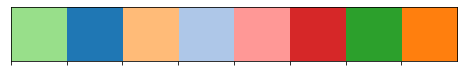

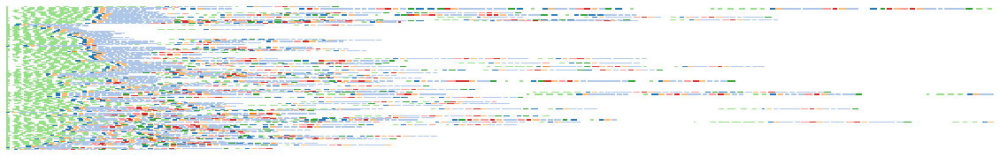

Bird8 labels ['0' '1' '3' '2']


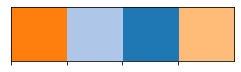

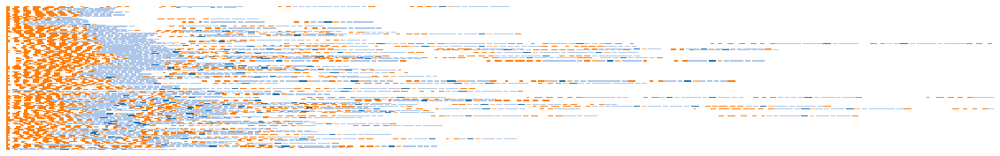

Bird1
Bird1 hdbscan_labels [12  3  6  0  2  4  8  5  9  7 11  1 10 -1]


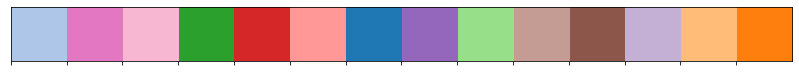

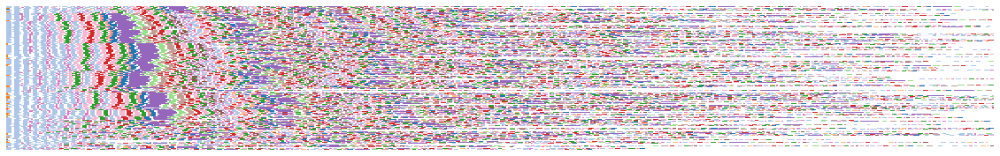

Bird1 labels ['0' '1' '2' '4' '3' '6' '7' '8' '9' 'a' '5' 'c']


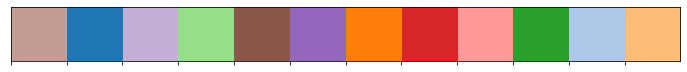

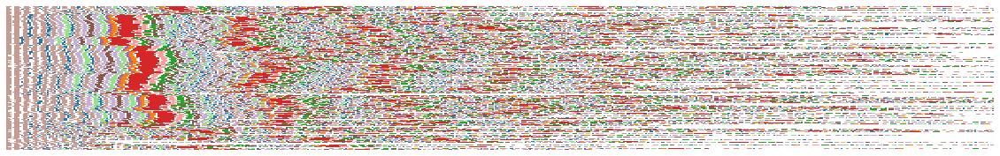

Bird3
Bird3 hdbscan_labels [ 6  0  1 10  4  9  8  3  7  5  2]


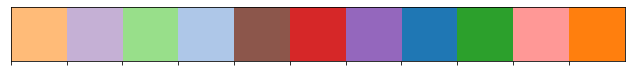

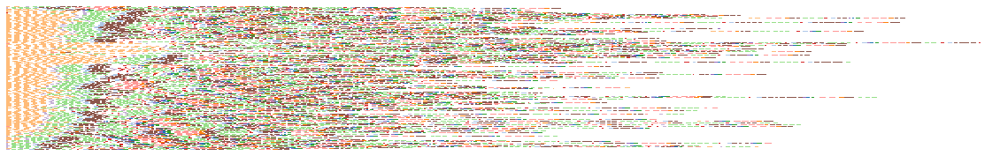

Bird3 labels ['0' '1' '2' '4' '3' '5' '6' '7' '8']


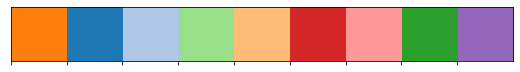

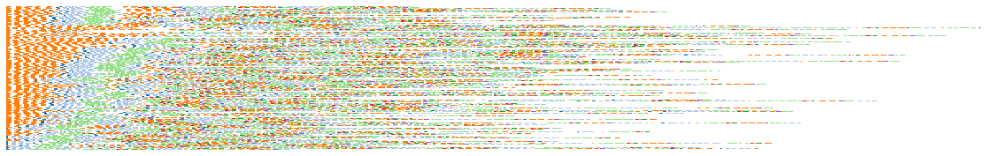

Bird6
Bird6 hdbscan_labels [1 2 0 4 3]


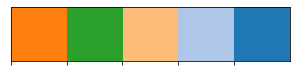

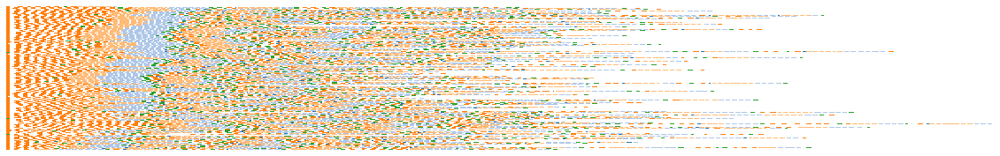

Bird6 labels ['0' '3' '1' '2' '4']


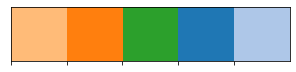

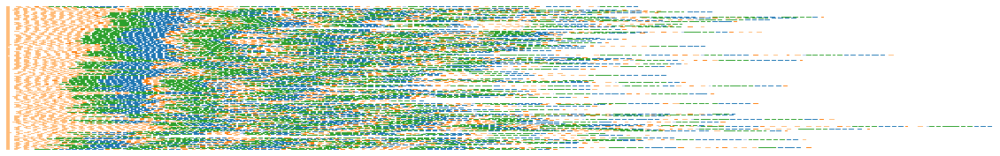

Bird4
Bird4 hdbscan_labels [ 4  2  3  1  0  5 -1]


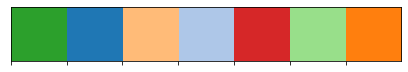

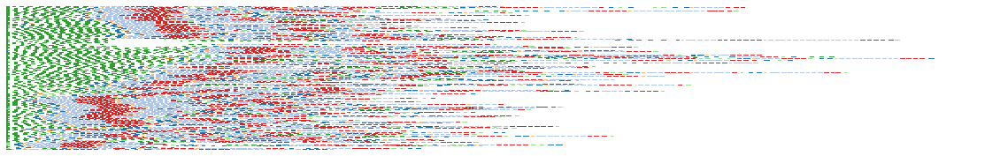

Bird4 labels ['0' '1' '2' '3' '4']


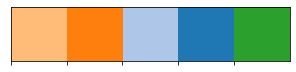

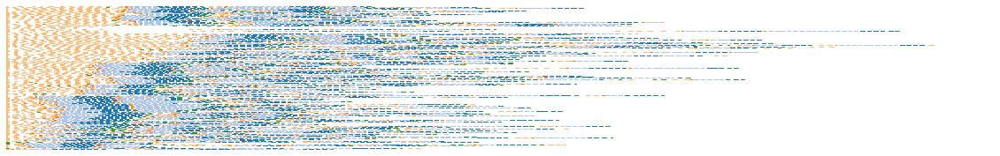

Bird7
Bird7 hdbscan_labels [4 2 0 7 1 3 5 6]


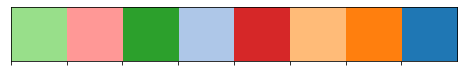

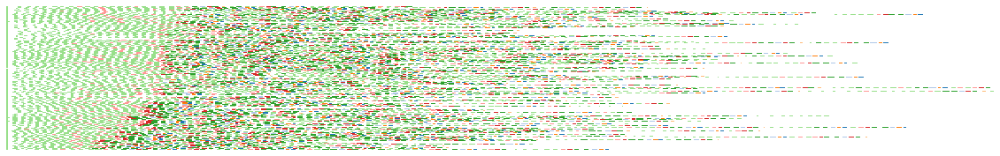

Bird7 labels ['0' '1' '2' '3' '5' '6' '4']


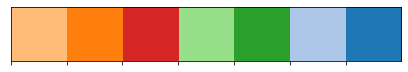

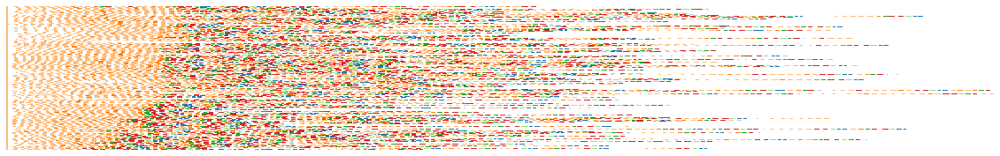

Bird10
Bird10 hdbscan_labels [12  7  4  5  0  6  3  2 11 10  1  9  8]


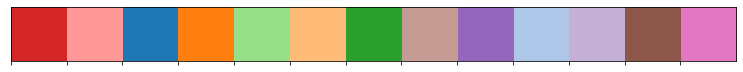

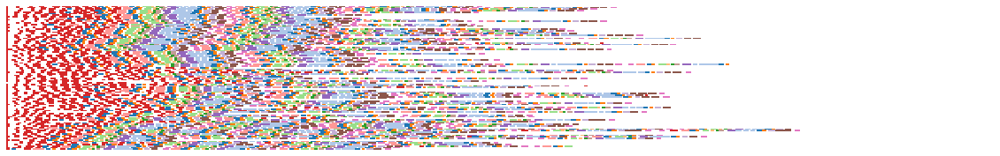

Bird10 labels ['0' '1' 'b' '8' '2' '3' '4' '5' '6' '7' '9' 'a']


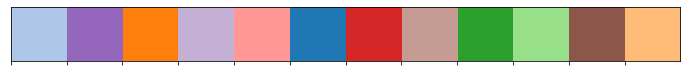

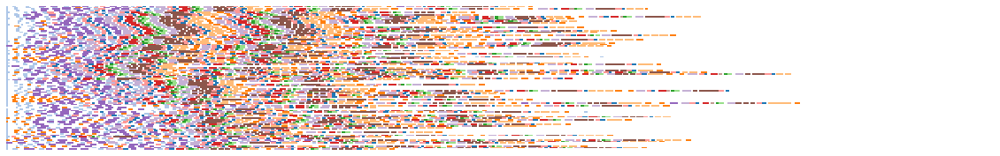

Bird5
Bird5 hdbscan_labels [12  9  1  3  6  7  4  2 14 13 11 10  8  0  5 -1]


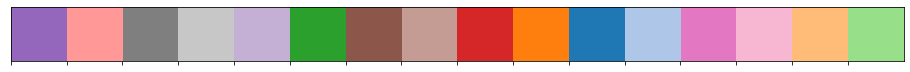

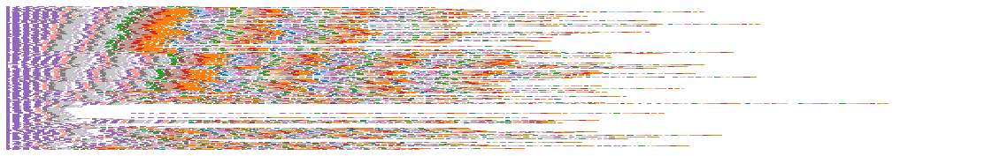

Bird5 labels ['0' '1' '2' '3' '4' '5' '6']


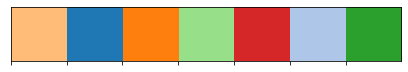

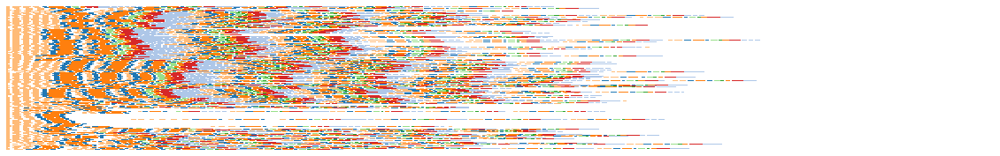

Bird2
Bird2 hdbscan_labels [19 18 12  9 13 17  3  1  2 14 10  0  6  7  4 16  8  5 11 15 -1]


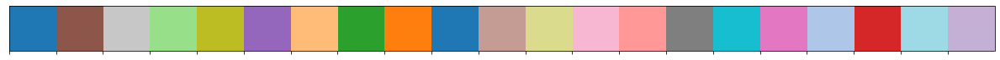

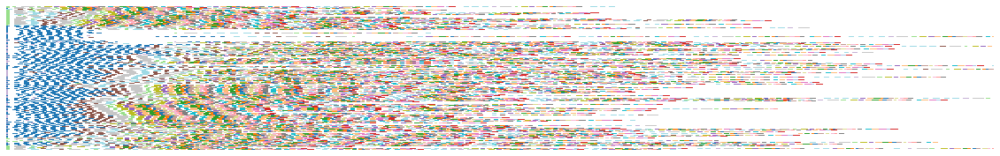

Bird2 labels ['0' '1' '2' '3' '4' '5' '6' '7' '8' '9' 'a' 'b' 'c' 'd' 'e' 'f' 'g']


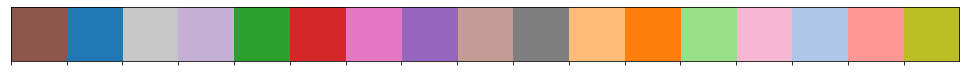

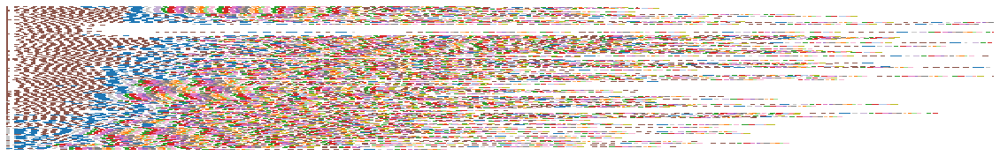

Bird0
Bird0 hdbscan_labels [11  6  0 12  5  9  2 10  7  1  4  3  8 13]


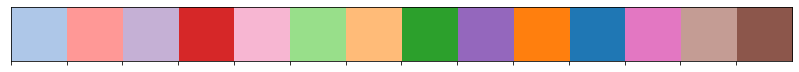

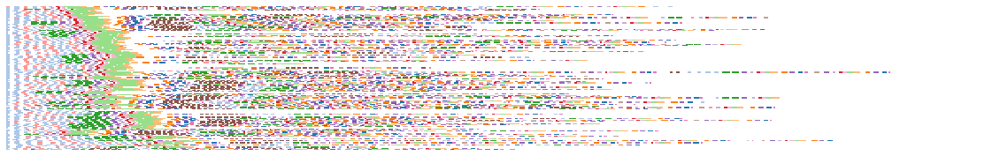

Bird0 labels ['0' '1' '3' '4' '5' '6' '2' '7' '8']


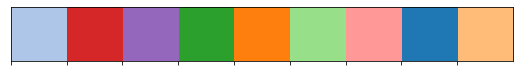

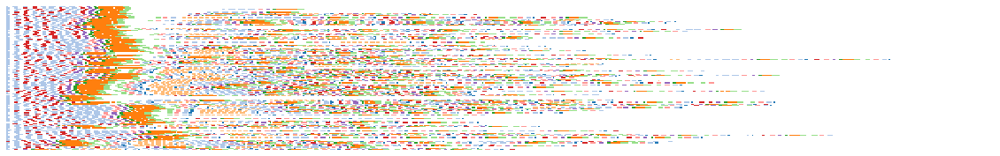

Bird9
Bird9 hdbscan_labels [6 4 3 2 1 0 5]


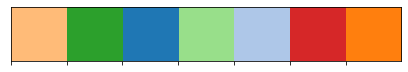

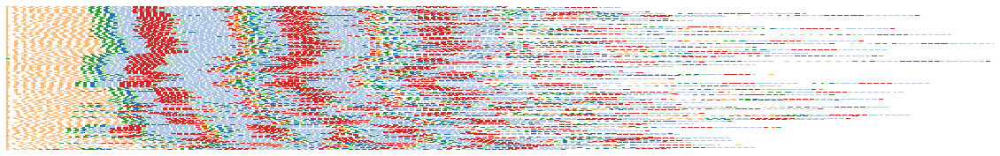

Bird9 labels ['0' '1' '2' '3' '4' '5']


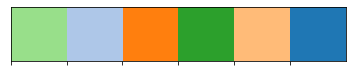

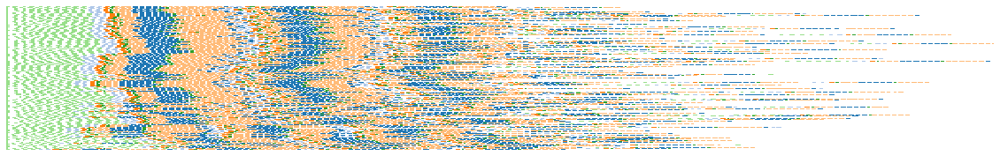

In [105]:
indv_dict = {}
# for each individual in the dataset
for indv in tqdm(syllable_df.indv.unique()):
    print(indv)
    indv_dict[indv] = {}
    for label in ["hdbscan_labels", "labels"]:
        print(indv, label, syllable_df[syllable_df.indv == indv][label].unique())
        color_lists, trans_lists, label_pal_dict, label_pal, label_dict = indv_barcode(
            syllable_df[syllable_df.indv == indv],
            time_resolution=0.03,
            label=label,
            pal="tab20",
        )
        indv_dict[indv][label] = {
            "label_pal_dict": label_pal_dict,
            "label_dict": label_dict,
        }

        fig, ax = plt.subplots(figsize=(20, 3))
        plot_sorted_barcodes(
            color_lists,
            trans_lists,
            max_list_len=600,
            seq_len=100,
            nex=200,
            figsize=(10, 4),
            ax=ax,
        )
        plt.show()

### Plot transitions

In [41]:
from avgn.visualization.projections import draw_projection_transitions
from avgn.visualization.projections import scatter_spec

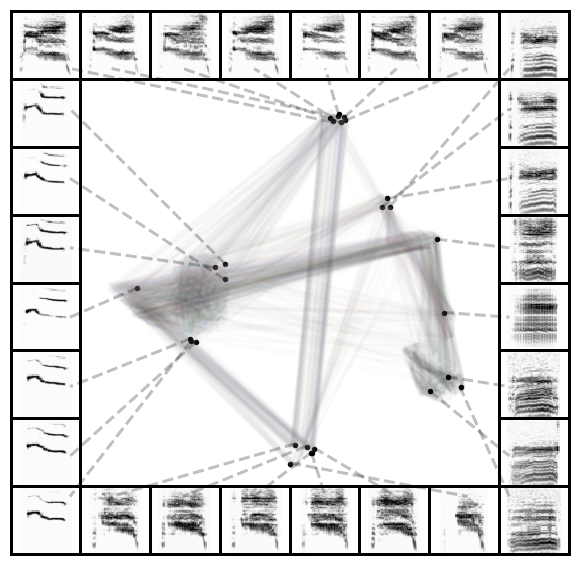

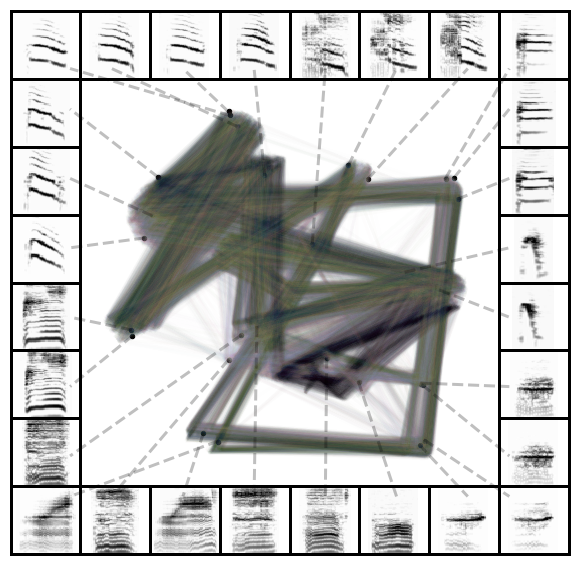

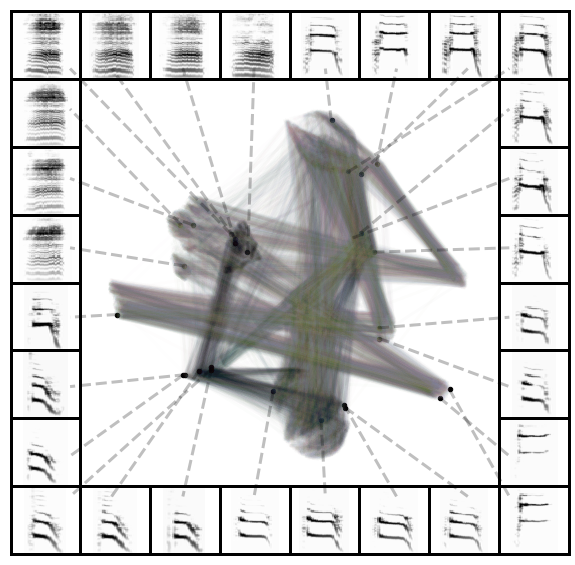

In [45]:
for indv in tqdm(syllable_df.indv.unique()[:3]):
    indv_df = syllable_df[syllable_df.indv == indv]
    
    
    fig, axs, main_ax, [xmin, xmax, ymin, ymax] = scatter_spec(
        np.vstack(indv_df.umap.values),
        indv_df.spectrogram.values,
        column_size=8,
        pal_color="tab20",
        color_points=False,
        enlarge_points=20,
        figsize=(10, 10),
        scatter_kwargs = {
            'alpha':0.25,
            's': 1,
            'show_legend': False
        },
        matshow_kwargs = {
            'cmap': plt.cm.Greys
        },
        line_kwargs = {
            'lw':3,
            'ls':"dashed",
            'alpha':0.25,
        },
        draw_lines=True,
        n_subset= 1000,
        border_line_width = 3,
        show_scatter=False,
    );
    
    draw_projection_transitions(
            np.vstack(indv_df.umap.values),
            indv_df.syllables_sequence_id.values,
            indv_df.syllables_sequence_pos.values,
            ax=main_ax,
            alpha=0.01,
        )
    plt.show()

### plot transition graph

In [46]:
from avgn.visualization.network_graph import plot_network_graph

Bird8
hdbscan_labels


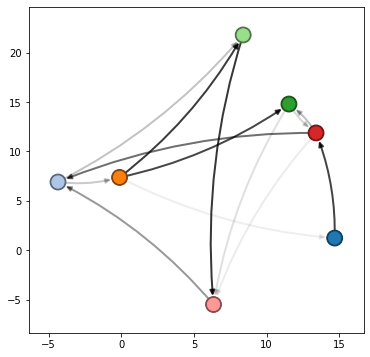

labels


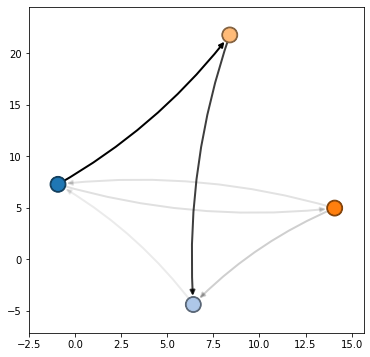

In [83]:
# for each individual in the dataset
for indv in tqdm(syllable_df.indv.unique()[:1]):
    indv_df = syllable_df[syllable_df.indv == indv]
    print(indv)
    for label in ["hdbscan_labels", "labels"]:
        print(label)
        # plot graph
        elements = indv_df[label].values
        projections = np.array(list(indv_df['umap'].values))
        sequence_ids = np.array(indv_df["syllables_sequence_id"])
        
        label_pal_dict = indv_dict[indv][label]['label_pal_dict']
        label_dict = indv_dict[indv][label]['label_dict']
        
        pal_dict = {i:label_pal_dict[j] for i,j in label_dict.items()}
        fig, ax = plt.subplots(figsize=(6,6))
        plot_network_graph(
            elements, projections, sequence_ids, color_palette="tab20", ax=ax, pal_dict=pal_dict
        )
        plt.show()

### Plot labels over bout
- to plot this, we need to compute spectrograms of the full bout

In [101]:
from avgn.utils.hparams import HParams
from avgn.dataset import DataSet
import librosa
from vocalseg.utils import butter_bandpass_filter, spectrogram, int16tofloat32, plot_spec

In [107]:
import matplotlib.patches as mpatches
from matplotlib.collections import PatchCollection

In [91]:
DATASET_ID = 'koumura_bengalese_finch'

In [92]:
hparams = HParams(
    num_mel_bins = 32,
    mel_lower_edge_hertz=500,
    mel_upper_edge_hertz=15000,
    butter_lowcut = 500,
    butter_highcut = 15000,
    ref_level_db = 20,
    min_level_db = -25,
    mask_spec = True,
    win_length_ms = 10,
    hop_length_ms = 2,
    nex=-1,
    n_jobs=-1,
    verbosity = 1,
)

In [93]:
# create a dataset object
dataset = DataSet(DATASET_ID, hparams = hparams)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 32 concurrent workers.
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 1600 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 2720 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done 2964 out of 2964 | elapsed:    9.2s finished


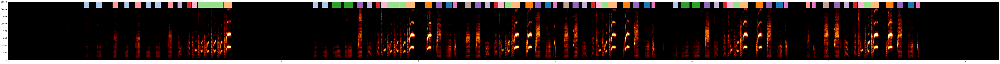

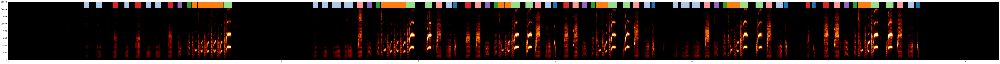

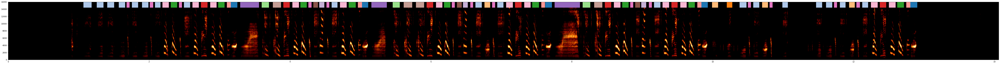

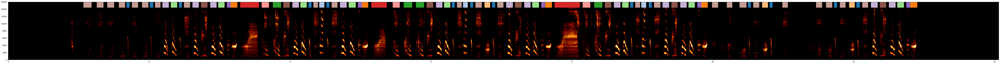

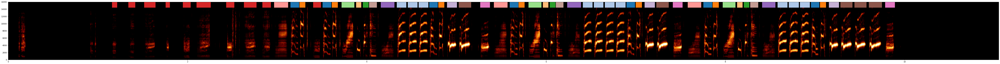

...

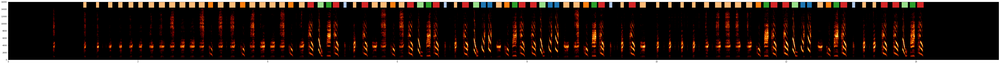

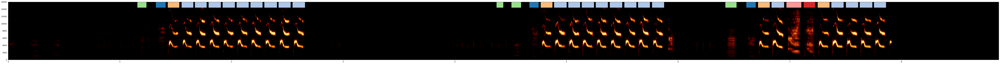

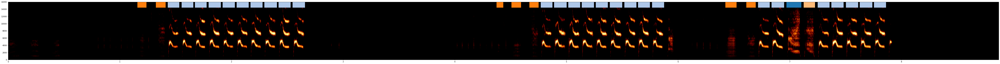

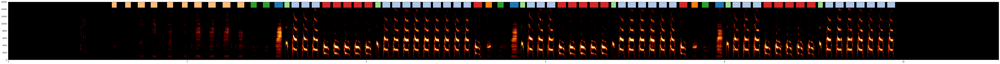

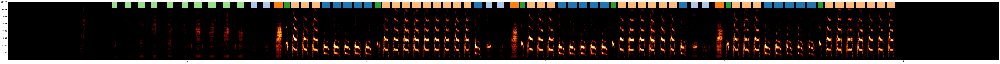

In [108]:
indvs = np.array([list(i)[0] for i in dataset.json_indv])

for indv in np.unique(indvs):
    # get key for individual
    for label in ["hdbscan_labels", "labels"]:
        key = np.array(list(dataset.data_files.keys()))[indvs == indv][0]

        # load the wav
        wav, rate = librosa.core.load(dataset.data_files[key].data["wav_loc"], sr=None)
        data = butter_bandpass_filter(wav, 500, 15000, rate)

        # create the spectrogram
        spec = spectrogram(
            data,
            rate,
            n_fft=1024,
            hop_length_ms=1,
            win_length_ms=5,
            ref_level_db=20,
            min_level_db=-60,
        )

        # plot the spectrogram with labels
        fig, ax = plt.subplots(figsize=(100, 6))
        plot_spec(spec, fig, ax, hop_len_ms=1, rate=rate, show_cbar=False)
        ymin, ymax = ax.get_ylim()
        for ix, row in tqdm(syllable_df[syllable_df.key == key].iterrows()):
            # ax.axvline(row.start_time)
            # ax.axvline(row.end_time)
            color = indv_dict[row.indv][label]["label_pal_dict"][
                indv_dict[row.indv][label]["label_dict"][row[label]]
            ]
            ax.add_patch(
                mpatches.Rectangle(
                    [row.start_time, ymax - (ymax - ymin) / 10],
                    row.end_time - row.start_time,
                    (ymax - ymin) / 10,
                    ec="none",
                    color=color,
                )
            )
        # ax.set_xlim([0.7, 9.3])
        ax.xaxis.tick_bottom()
        plt.show()